<a href="https://www.kaggle.com/code/samuelkamau/weed-detection?scriptVersionId=221693345" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Weed Detection using YOLO11
By
- $Samuel$ $Waweru$ $Kamau$ $(ENM221-0040/2020)$
- $Ray$ $Ngigi$ $Njoroge$ $(ENM221-0283/2020)$

Advised by
- $Ms$ $Grace$ $Wamuti$ 

## Introduction

YOLO11 (You Only Look Once, version 11) is a state-of-the-art object detection model known for its speed and accuracy. It processes images in real-time by dividing them into grids and predicting bounding boxes and class probabilities simultaneously. This efficiency makes it well-suited for agricultural applications such as weed detection, where timely and precise identification of unwanted vegetation can enhance crop yields and reduce reliance on chemical herbicides.


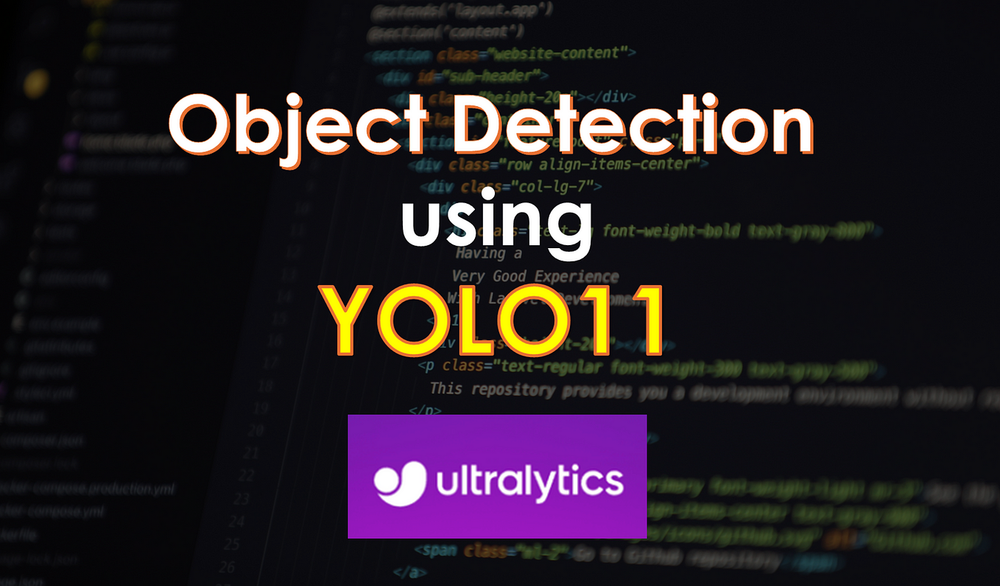

In [19]:
from IPython.display import display
from PIL import Image

image_path = "/kaggle/input/yolo-ultralytics/yolo_ultarlytics_image_cover.png"  # Update with your image path
img = Image.open(image_path)
display(img)


 To achieve weed detection, we fine-tune a pre-trained YOLO11 model using a dataset consisting of labeled images of crops and weeds. By training the model with annotated agricultural data, it learns to distinguish between crops and unwanted plants, enabling automated weed control in smart farming systems.


---
# Data Preparation

This involved taking photos in my Kitchen garden for crops present e.g. Spinach,Kales and weeds present e.g. *Biden Pilosa* (Black Jack) and Clover weeds.

This was followed by Annotating using the CVAT Web application to create bounding areas for the weeds and crops. Then, the annotated images were saved in a Yolo format, i.e., an image file (jpeg) and its associated text file (txt extension).

After annotating, the next process is to Engineer the Data. This involves looking at the size of the data for finetuning, comparing the size of the crop from weeds to prevent any chances of ***overfitting*** and seeing whether more data is required to compensate for any difference i.e. More collection or use of synthetic data.

Finally, splitting the data into **Training (80%), Validation (10%) and Testing (10%)**

### Data Collection and Anotation

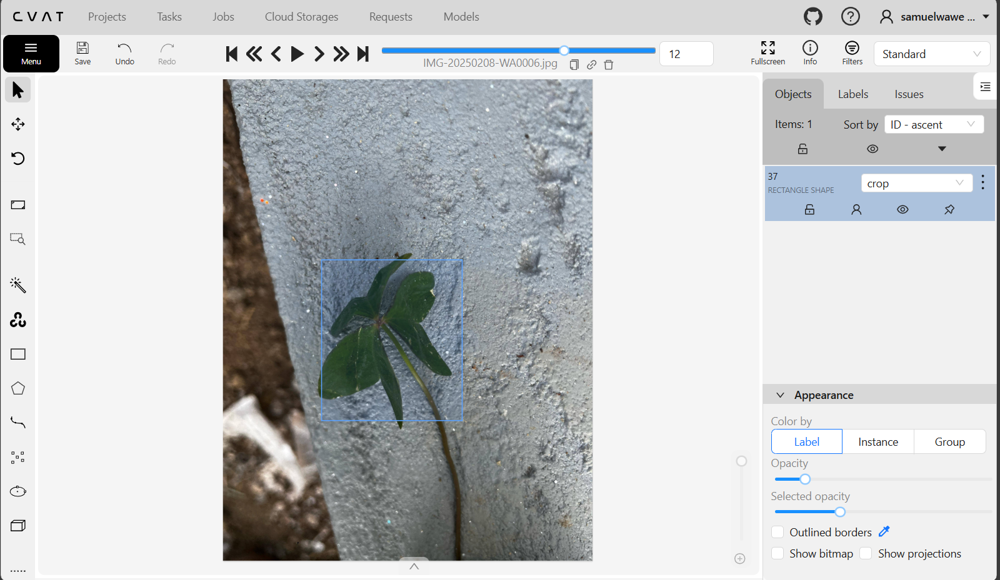

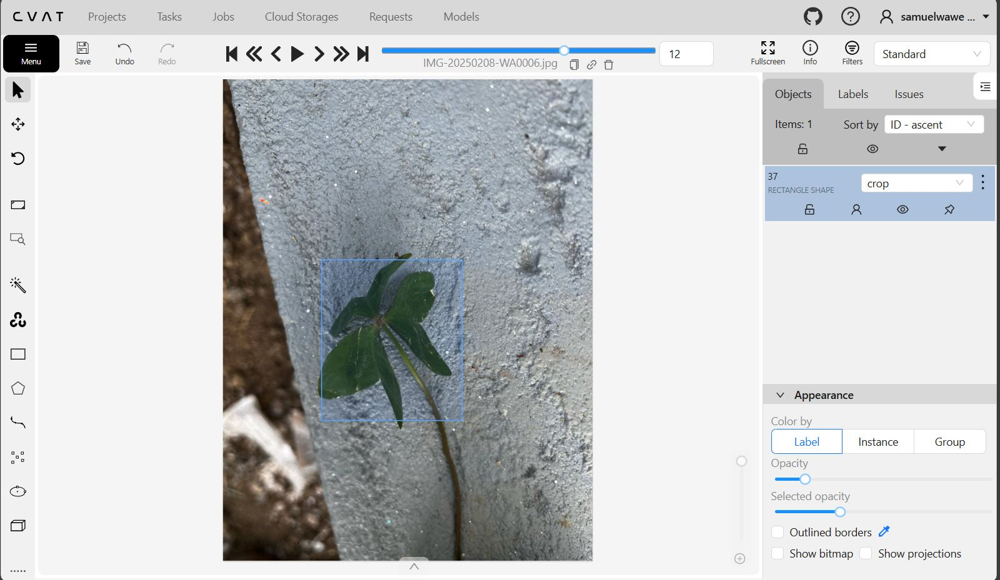

In [20]:
image_path = "/kaggle/input/annotation/annotation_process.JPG"  # Update with your image path
img = Image.open(image_path)
display(img)

### Data Splitting

In [1]:
! pip install split-folders

In [2]:
import os
import shutil
from collections import Counter

# Define paths
original_dataset_path = "/kaggle/input/agri-data1/data"  # Read-only directory
dataset_path = "/kaggle/working/agri_data"  # Writable directory

# Copy dataset to /kaggle/working/
if not os.path.exists(dataset_path):
    shutil.copytree(original_dataset_path, dataset_path)

# Define class folders
crop_folder = os.path.join(dataset_path, "crop")
weed_folder = os.path.join(dataset_path, "weed")

# Create subfolders if they don’t exist
os.makedirs(crop_folder, exist_ok=True)
os.makedirs(weed_folder, exist_ok=True)

# Process all images and annotation files
for file in os.listdir(dataset_path):
    if file.endswith(".jpeg"):
        annotation_file = file.replace(".jpeg", ".txt")  # Find the corresponding annotation file
        annotation_path = os.path.join(dataset_path, annotation_file)
        image_path = os.path.join(dataset_path, file)

        # Ensure both image and annotation files exist
        if os.path.exists(annotation_path):
            with open(annotation_path, "r") as f:
                lines = f.readlines()

            # Skip empty annotation files
            if not lines:
                print(f"⚠️ Skipping {file} (empty annotation)")
                continue

            # Count occurrences of each class
            class_labels = [line.split()[0] for line in lines]
            most_common_class = Counter(class_labels).most_common(1)[0][0]  # Get most frequent class

            # Determine destination folder
            if most_common_class == "0":  # Crop
                dest_folder = crop_folder
            elif most_common_class == "1":  # Weed
                dest_folder = weed_folder
            else:
                print(f"⚠️ Skipping {file} (unknown class label: {most_common_class})")
                continue

            # Move both image and annotation files to the determined folder
            shutil.move(image_path, os.path.join(dest_folder, file))
            shutil.move(annotation_path, os.path.join(dest_folder, annotation_file))

print("✅ Dataset successfully organized into class folders with paired image and annotation files!")


✅ Dataset successfully organized into class folders with paired image and annotation files!


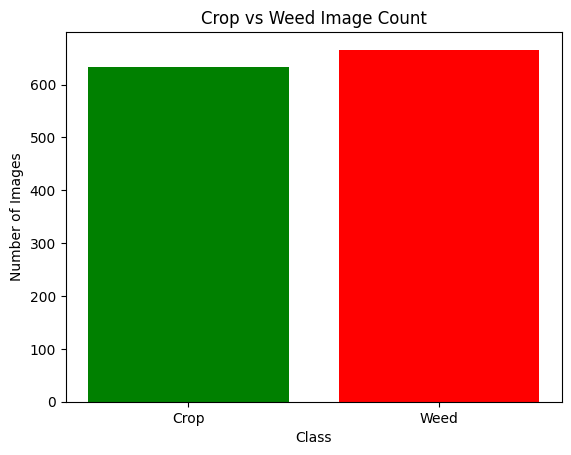

In [3]:
import matplotlib.pyplot as plt

# Define paths
crop_folder = "/kaggle/working/agri_data/crop"
weed_folder = "/kaggle/working/agri_data/weed"

# Count number of files in each folder
num_crop_images = len([f for f in os.listdir(crop_folder) if f.endswith(".jpeg")])
num_weed_images = len([f for f in os.listdir(weed_folder) if f.endswith(".jpeg")])

# Create a bar chart
categories = ['Crop', 'Weed']
counts = [num_crop_images, num_weed_images]

plt.bar(categories, counts, color=['green', 'red'])
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Crop vs Weed Image Count')
plt.show()

In [4]:
import os
import shutil
import random

# Define paths
dataset_path = "/kaggle/working/agri_data"  # Your original dataset path
split_path = "/kaggle/working/agri_data_split"  # The path where your split data will go

# Create directories if they don’t exist
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(split_path, split), exist_ok=True)

# Get all image files for both crop and weed classes
all_image_files = []
for folder in ['crop', 'weed']:
    folder_path = os.path.join(dataset_path, folder)
    image_files = [os.path.join(folder, f) for f in os.listdir(folder_path) if f.endswith(".jpeg")]
    all_image_files.extend(image_files)

# Shuffle the image files randomly
random.shuffle(all_image_files)

# Calculate split indices
total_files = len(all_image_files)
train_end = int(0.8 * total_files)
val_end = train_end + int(0.1 * total_files)

# Split the data into train, val, and test
train_files = all_image_files[:train_end]
val_files = all_image_files[train_end:val_end]
test_files = all_image_files[val_end:]

# Function to move both image and annotation files
def move_files(files, split_folder):
    for file in files:
        # Move the image file
        image_src = os.path.join(dataset_path, file)
        image_dst = os.path.join(split_path, split_folder, os.path.basename(file))
        shutil.move(image_src, image_dst)

        # Move the corresponding annotation file
        annotation_file = file.replace(".jpeg", ".txt")
        annotation_src = os.path.join(dataset_path, annotation_file)
        if os.path.exists(annotation_src):  # Ensure the annotation file exists
            annotation_dst = os.path.join(split_path, split_folder, os.path.basename(annotation_file))
            shutil.move(annotation_src, annotation_dst)

# Move the files to the appropriate directories
move_files(train_files, 'train')
move_files(val_files, 'val')
move_files(test_files, 'test')

print("✅ Dataset successfully split into train, val, and test folders with annotations!")


✅ Dataset successfully split into train, val, and test folders with annotations!


[1040, 130, 130]


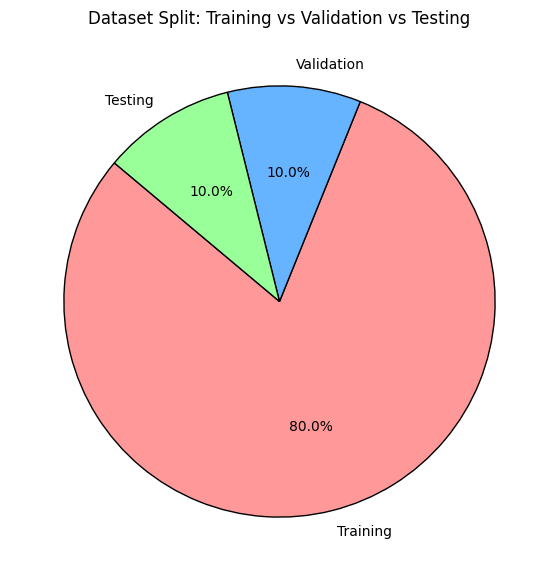

In [5]:
# Define dataset sizes
train_size = len(train_files)
val_size = len(val_files)
test_size = len(test_files)

# Labels and sizes
labels = ['Training', 'Validation', 'Testing']
sizes = [train_size, val_size, test_size]
colors = ['#ff9999','#66b3ff','#99ff99']  # Colors for each section
print(sizes)
# Create pie chart
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140, wedgeprops={'edgecolor': 'black'})

# Title and display
plt.title("Dataset Split: Training vs Validation vs Testing")
plt.show()

---
# Training the Model

In [6]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 15.5 MB/s eta 0:00:00a 0:00:01


In [7]:
from ultralytics import YOLO
import torch
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [8]:
# Load a model
model = YOLO("yolo11n.yaml")


#path: C:\Users\hp\OneDrive\Documents\5th_Year\Weed_Detector\agri_data
#train: data
#val: data
#test:test

# classes
#names:
#  0: crop
#  1: weed


In [10]:
# Training the model
train_results = model.train(
    data="/kaggle/input/updated/config.yaml",  # path to dataset YAML
    epochs=60  # number of training epochs
    )



Ultralytics 8.3.73 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=/kaggle/input/updated/config.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

train: Scanning /kaggle/working/agri_data_split/train.cache... 1040 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1040/1040 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/agri_data_split/val.cache... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60       2.6G      3.155      3.746      4.154         69        640: 100%|██████████| 65/65 [00:12<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.26it/s]

                   all        130        209    0.00455        0.7    0.00963    0.00364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      2.55G      3.016      3.414      3.619         57        640: 100%|██████████| 65/65 [00:11<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.99it/s]

                   all        130        209      0.626      0.171     0.0896      0.023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60       2.5G      2.675      3.118      3.228         60        640: 100%|██████████| 65/65 [00:11<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.62it/s]

                   all        130        209      0.199      0.189      0.146     0.0422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      2.53G      2.382      2.766      2.863         48        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.44it/s]

                   all        130        209      0.137      0.123     0.0551     0.0162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      2.55G      2.233      2.516      2.688         72        640: 100%|██████████| 65/65 [00:11<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.08it/s]

                   all        130        209      0.199       0.36      0.166     0.0658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60       2.5G      2.117      2.379      2.568         63        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.92it/s]

                   all        130        209      0.112      0.174      0.109     0.0362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60       2.5G      2.063      2.288      2.483         47        640: 100%|██████████| 65/65 [00:10<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.72it/s]

                   all        130        209      0.453      0.608      0.422      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      2.55G      2.023      2.175      2.431         44        640: 100%|██████████| 65/65 [00:11<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.95it/s]

                   all        130        209      0.503      0.417      0.421      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      2.52G      1.957      2.085      2.349         51        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.84it/s]

                   all        130        209      0.568      0.579      0.532      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60       2.6G      1.918      2.077      2.322         52        640: 100%|██████████| 65/65 [00:11<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.13it/s]

                   all        130        209      0.693      0.485      0.626      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      2.53G      1.901      2.045      2.291         74        640: 100%|██████████| 65/65 [00:11<00:00,  5.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.04it/s]

                   all        130        209      0.564       0.65       0.56      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60       2.5G      1.828      1.957      2.239         61        640: 100%|██████████| 65/65 [00:10<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.83it/s]

                   all        130        209      0.531      0.565      0.481      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      2.53G      1.805      1.884        2.2         86        640: 100%|██████████| 65/65 [00:11<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.42it/s]

                   all        130        209      0.551      0.679      0.581      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      2.52G      1.784      1.878      2.177         65        640: 100%|██████████| 65/65 [00:10<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.12it/s]

                   all        130        209      0.527      0.634      0.506       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      2.52G      1.756      1.822      2.152         44        640: 100%|██████████| 65/65 [00:11<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.05it/s]

                   all        130        209       0.64      0.662      0.645      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60       2.5G       1.71      1.755      2.102         48        640: 100%|██████████| 65/65 [00:11<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.74it/s]

                   all        130        209       0.59      0.736      0.714      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      2.55G      1.709      1.732      2.072         59        640: 100%|██████████| 65/65 [00:10<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]

                   all        130        209       0.53      0.684      0.526      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      2.52G      1.691      1.752        2.1         39        640: 100%|██████████| 65/65 [00:11<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.02it/s]

                   all        130        209      0.667      0.662      0.696      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      2.53G      1.691      1.703      2.071         54        640: 100%|██████████| 65/65 [00:11<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.97it/s]

                   all        130        209       0.58      0.672      0.628      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      2.52G       1.64      1.668      2.026         40        640: 100%|██████████| 65/65 [00:10<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.97it/s]

                   all        130        209      0.663      0.657      0.631        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      2.53G       1.63      1.654      2.015         59        640: 100%|██████████| 65/65 [00:11<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.93it/s]

                   all        130        209      0.749      0.662      0.761      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60       2.5G      1.613      1.628      1.988         68        640: 100%|██████████| 65/65 [00:10<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.91it/s]

                   all        130        209      0.757      0.667      0.761       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      2.55G      1.603      1.588      1.966         52        640: 100%|██████████| 65/65 [00:11<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]

                   all        130        209      0.651      0.746      0.761       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      2.53G      1.598      1.591      1.965         45        640: 100%|██████████| 65/65 [00:10<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.14it/s]

                   all        130        209      0.811      0.598      0.759      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60       2.5G      1.613      1.564      1.965         63        640: 100%|██████████| 65/65 [00:11<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.32it/s]

                   all        130        209      0.684      0.724      0.763      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60       2.5G       1.57      1.533      1.924         49        640: 100%|██████████| 65/65 [00:11<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.12it/s]

                   all        130        209      0.724      0.722      0.767      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      2.55G      1.544      1.551      1.945         50        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

                   all        130        209      0.596      0.612      0.674      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      2.49G      1.551      1.524      1.907         54        640: 100%|██████████| 65/65 [00:10<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.65it/s]

                   all        130        209      0.659      0.745      0.725      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60       2.5G      1.533       1.52      1.896         61        640: 100%|██████████| 65/65 [00:11<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.16it/s]

                   all        130        209       0.73      0.677      0.766      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      2.55G      1.537      1.501      1.914         40        640: 100%|██████████| 65/65 [00:11<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.07it/s]

                   all        130        209      0.596      0.626      0.661      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      2.53G      1.523      1.527      1.912         76        640: 100%|██████████| 65/65 [00:11<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.19it/s]

                   all        130        209      0.592      0.706      0.719       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      2.52G      1.512      1.456      1.879         55        640: 100%|██████████| 65/65 [00:11<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.82it/s]

                   all        130        209      0.676      0.785      0.796      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      2.52G      1.477      1.431       1.85         40        640: 100%|██████████| 65/65 [00:11<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.90it/s]

                   all        130        209       0.84      0.695      0.806      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60       2.5G      1.501      1.437      1.858         57        640: 100%|██████████| 65/65 [00:11<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.51it/s]

                   all        130        209      0.746      0.717       0.78      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      2.52G      1.468      1.418      1.833         53        640: 100%|██████████| 65/65 [00:10<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.06it/s]

                   all        130        209      0.733      0.725      0.766      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      2.52G      1.466      1.385      1.829         61        640: 100%|██████████| 65/65 [00:11<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.18it/s]

                   all        130        209      0.759      0.736      0.809      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60       2.5G      1.463      1.376      1.823         47        640: 100%|██████████| 65/65 [00:10<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.30it/s]

                   all        130        209      0.747      0.711      0.768      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60       2.5G      1.453      1.392       1.84         49        640: 100%|██████████| 65/65 [00:10<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.78it/s]

                   all        130        209      0.748      0.738      0.822       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      2.62G      1.445      1.382      1.831         67        640: 100%|██████████| 65/65 [00:11<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.21it/s]

                   all        130        209      0.752      0.748      0.806      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      2.52G       1.45       1.34      1.792         43        640: 100%|██████████| 65/65 [00:10<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.19it/s]

                   all        130        209       0.74      0.748      0.806      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      2.55G      1.428      1.362      1.806         62        640: 100%|██████████| 65/65 [00:11<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.42it/s]

                   all        130        209      0.806      0.701      0.813      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      2.53G      1.419      1.347      1.785         70        640: 100%|██████████| 65/65 [00:10<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.14it/s]

                   all        130        209      0.717      0.766      0.764      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60       2.5G      1.421      1.325      1.804         52        640: 100%|██████████| 65/65 [00:10<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.07it/s]

                   all        130        209       0.79      0.682      0.791      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      2.52G      1.422       1.36       1.78         47        640: 100%|██████████| 65/65 [00:11<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.01it/s]

                   all        130        209      0.757      0.749      0.793      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      2.55G      1.392      1.299      1.772         54        640: 100%|██████████| 65/65 [00:10<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.14it/s]

                   all        130        209      0.771      0.746      0.828      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      2.56G      1.397      1.295      1.758         64        640: 100%|██████████| 65/65 [00:11<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.93it/s]

                   all        130        209      0.772      0.758      0.832      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      2.55G      1.401      1.283      1.759         67        640: 100%|██████████| 65/65 [00:11<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]

                   all        130        209       0.78      0.756      0.822      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      2.52G      1.378      1.249      1.737         38        640: 100%|██████████| 65/65 [00:10<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.17it/s]

                   all        130        209      0.823       0.68      0.823      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      2.52G      1.378       1.25      1.744         42        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.89it/s]

                   all        130        209      0.771       0.79      0.839      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60       2.5G      1.366      1.282      1.765         45        640: 100%|██████████| 65/65 [00:10<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.16it/s]

                   all        130        209      0.801      0.751      0.837      0.523


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      2.56G      1.281      1.157      1.818         22        640: 100%|██████████| 65/65 [00:11<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.40it/s]

                   all        130        209      0.826      0.746      0.845      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      2.52G      1.246      1.042      1.786         21        640: 100%|██████████| 65/65 [00:10<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.28it/s]

                   all        130        209      0.779      0.775      0.822      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      2.52G      1.226      1.004      1.748         22        640: 100%|██████████| 65/65 [00:10<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.30it/s]

                   all        130        209      0.782      0.772      0.832      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      2.52G      1.211          1      1.748         26        640: 100%|██████████| 65/65 [00:11<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.37it/s]

                   all        130        209      0.786        0.8      0.845      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      2.52G      1.209      1.005      1.745         31        640: 100%|██████████| 65/65 [00:10<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.55it/s]

                   all        130        209      0.831      0.758      0.844      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60       2.5G      1.203     0.9763      1.724         25        640: 100%|██████████| 65/65 [00:10<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.27it/s]

                   all        130        209      0.796      0.773      0.845      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      2.53G      1.169     0.9552      1.705         30        640: 100%|██████████| 65/65 [00:10<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.35it/s]

                   all        130        209      0.807      0.773      0.859      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      2.52G      1.169     0.9679       1.71         25        640: 100%|██████████| 65/65 [00:11<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.39it/s]

                   all        130        209      0.831      0.761      0.848      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60       2.5G      1.162     0.9318      1.686         20        640: 100%|██████████| 65/65 [00:11<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.17it/s]

                   all        130        209      0.837      0.734      0.849      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      2.52G      1.133     0.9521      1.676         21        640: 100%|██████████| 65/65 [00:10<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.33it/s]

                   all        130        209      0.817      0.763      0.856       0.55



60 epochs completed in 0.212 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]


                   all        130        209      0.817      0.768      0.859      0.559
                  crop         60        123      0.772      0.732      0.831      0.544
                  weed         70         86      0.863      0.805      0.887      0.574


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train2


---
# Model Evaluation Metrics

### 1. F1 Score Curve (F1_curve.png): 
This curve represents the F1 score across various thresholds. Interpreting this curve can offer insights into the model's balance between false positives and false negatives over different thresholds.

### 2. Precision-Recall Curve (PR_curve.png): 
An integral visualization for any classification problem, this curve showcases the trade-offs between precision and recall at varied thresholds. It becomes especially significant when dealing with imbalanced classes.

### 3. Precision Curve (P_curve.png):
A graphical representation of precision values at different thresholds. This curve helps in understanding how precision varies as the threshold changes.

### 4. Recall Curve (R_curve.png):
Correspondingly, this graph illustrates how the recall values change across different thresholds.

### 5. Confusion Matrix (confusion_matrix.png):
The confusion matrix provides a detailed view of the outcomes, showcasing the counts of true positives, true negatives, false positives, and false negatives for each class.

### 6. Normalized Confusion Matrix (confusion_matrix_normalized.png):
This visualization is a normalized version of the confusion matrix. It represents the data in proportions rather than raw counts. This format makes it simpler to compare the performance across classes.

### 7. Validation Batch Labels (val_batchX_labels.jpg):
These images depict the ground truth labels for distinct batches from the validation dataset. They provide a clear picture of what the objects are and their respective locations as per the dataset.

### 8. Validation Batch Predictions (val_batchX_pred.jpg):
Contrasting the label images, these visuals display the predictions made by the YOLO11 model for the respective batches. By comparing these to the label images, you can easily assess how well the model detects and classifies objects visually.

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Evaluate on test set
metrics = model.val(data="/kaggle/input/updated/config.yaml", split="test")

# Extract key metrics
mAP50 = metrics.box.map50  # mAP@0.5
mAP5095 = metrics.box.map  # mAP@0.5:0.95
precision = metrics.box.mp  # Mean Precision
recall = metrics.box.mr  # Mean Recall
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print results
print(f"🔹 mAP@0.5: {mAP50:.4f}")
print(f"🔹 mAP@0.5:0.95: {mAP5095:.4f}")
print(f"🔹 Precision: {precision:.4f}")
print(f"🔹 Recall: {recall:.4f}")
print(f"🔹 F1-score: {f1_score:.4f}")

print(dir(metrics.box))  # List all available attributes



Ultralytics 8.3.73 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/agri_data_split/test... 130 images, 0 backgrounds, 0 corrupt: 100%|██████████| 130/130 [00:00<00:00, 1204.41it/s]

val: New cache created: /kaggle/working/agri_data_split/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]


                   all        130        182      0.887      0.782      0.876      0.579
                  crop         70        105      0.864      0.771      0.875      0.602
                  weed         60         77       0.91      0.792      0.877      0.556


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.3ms preprocess, 5.3ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/train22
🔹 mAP@0.5: 0.8758
🔹 mAP@0.5:0.95: 0.5786
🔹 Precision: 0.8870
🔹 Recall: 0.7818
🔹 F1-score: 0.8311
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'all_ap', 'ap', 'ap50', 'ap_class_index', 'class_result', 'curves', 'curves_results', 'f1', 'f1_curve', 'fitness', 'map', 'map50', 'map75', 'maps', 'mean_results', 'mp', 'mr', 'nc', 'p', 'p_curve', 'prec_values', 'px', 'r', 'r_curve', 'update']


### Interpretation of Results
It's important to understand the metrics. Here's what some of the commonly observed lower scores might suggest:


1. Low mAP: detect the model may need general refinements. 
2. Low IoU: The model might struggle. This indicates to pinpoint objects accurately. Different bounding box methods could help.
4. Low Precision: The model may detect too many non-existent objects. Adjusting confidence thresholds might reduce this.
6. Low Recall: The model could be missing real objects. Improving feature extraction or using more data might help.
7. Imbalanced F1 Score: There's a disparity between precision and recall.
8. Class-specific AP: Low scores here can highlight classes the model struggles with.

**Our YOLOv11 model demonstrates strong performance in detecting weeds and crops, with a high mAP@0.5 of 87.58%, indicating that it accurately identifies objects at a standard IoU threshold. However, the mAP@0.5:0.95 of 57.86% suggests that performance declines at stricter IoU thresholds, meaning the model's localization precision could be further refined. The precision of 88.70% indicates that false positives are minimal, while the recall of 78.18% shows the model occasionally misses some valid detections. The F1-score of 83.11% confirms a good balance between precision and recall. 🚀**

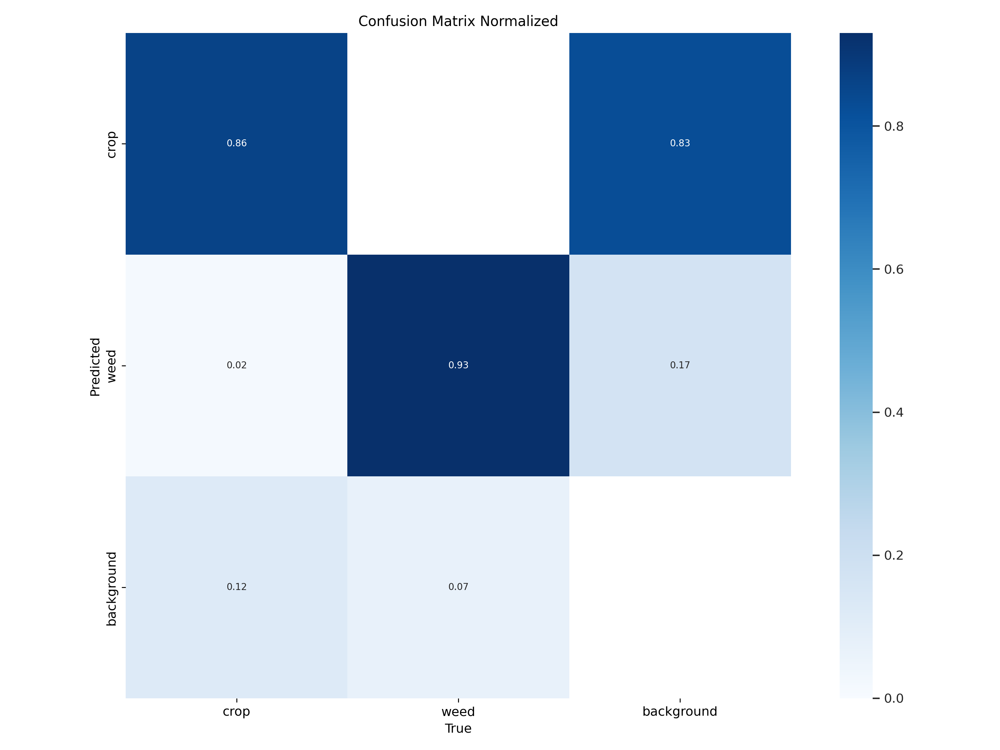

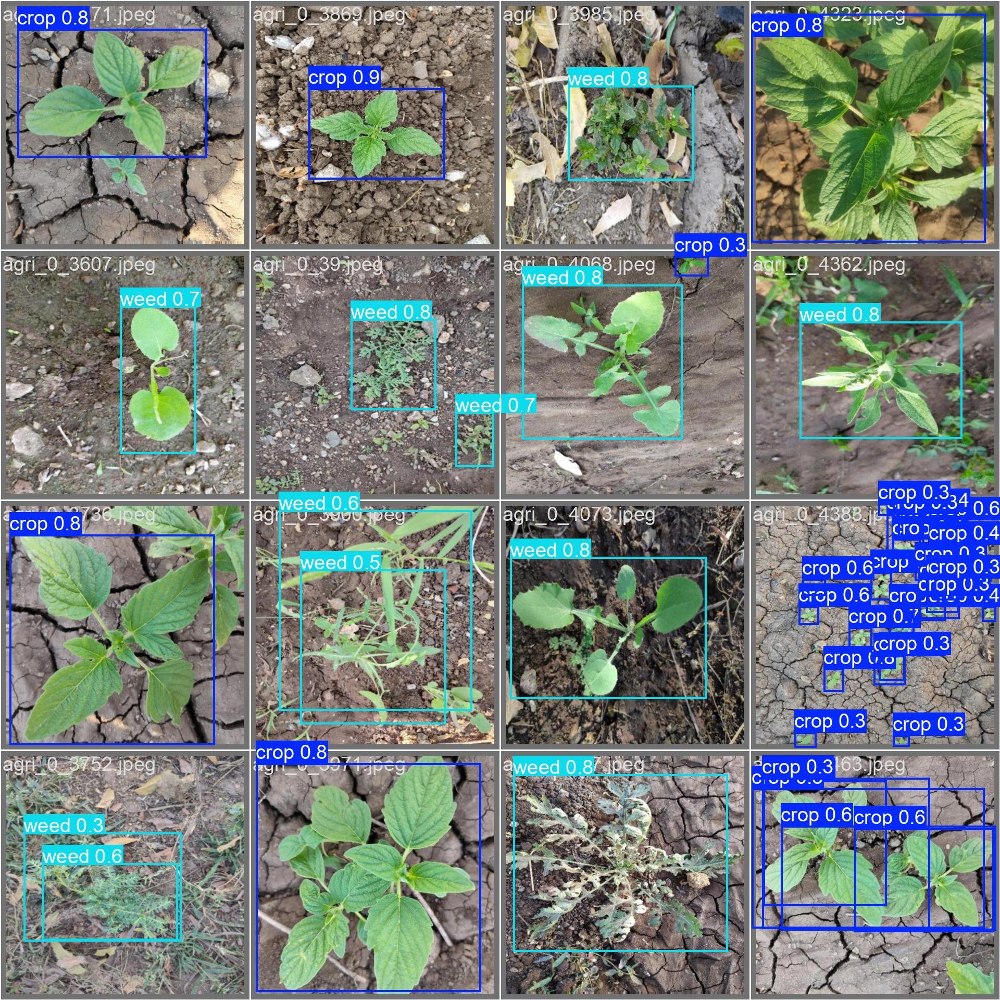

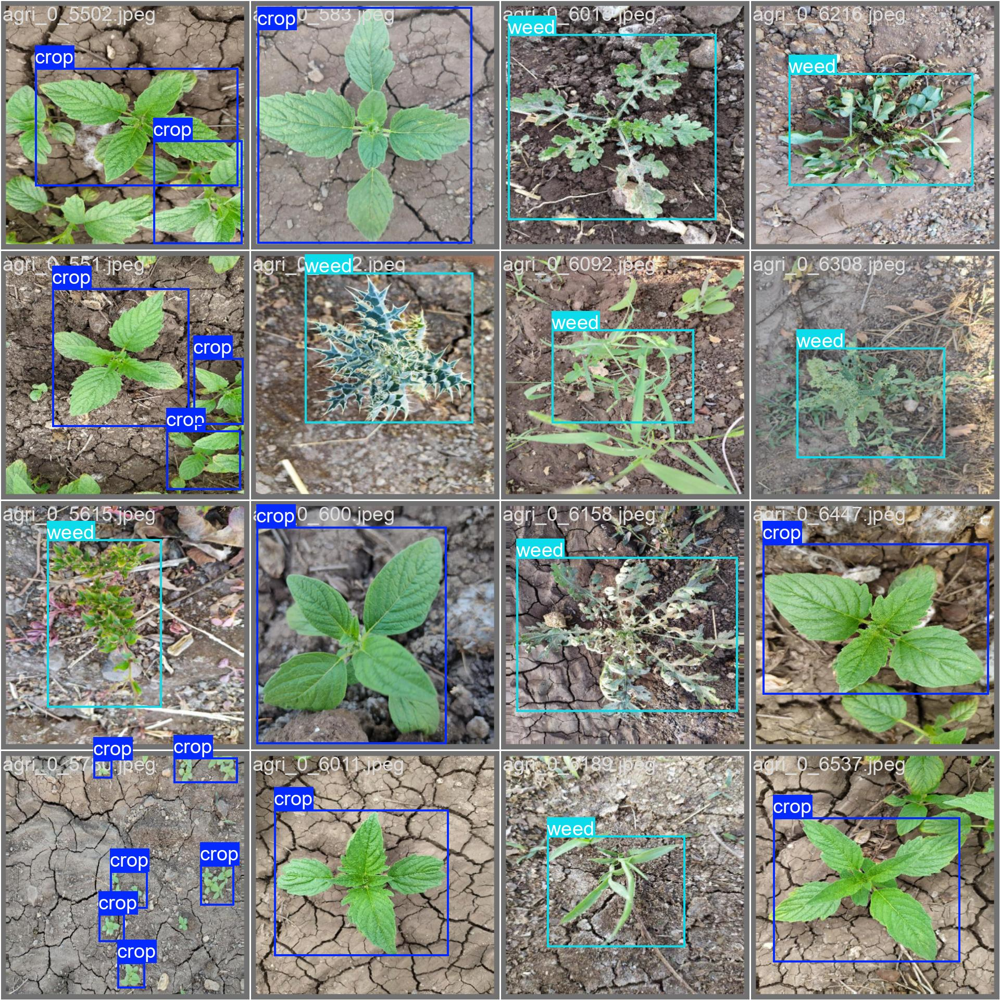

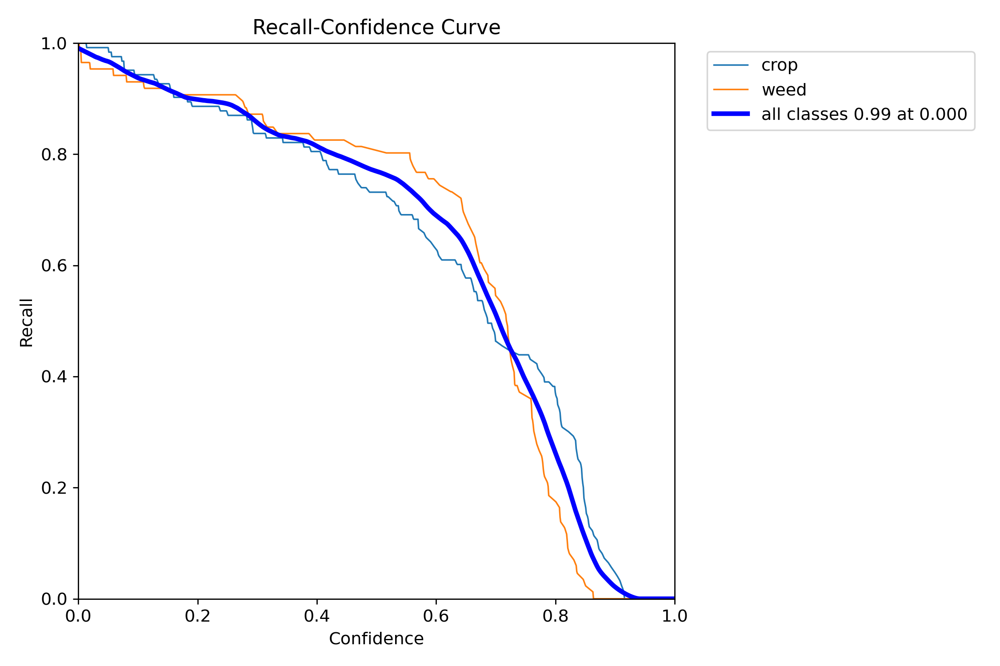

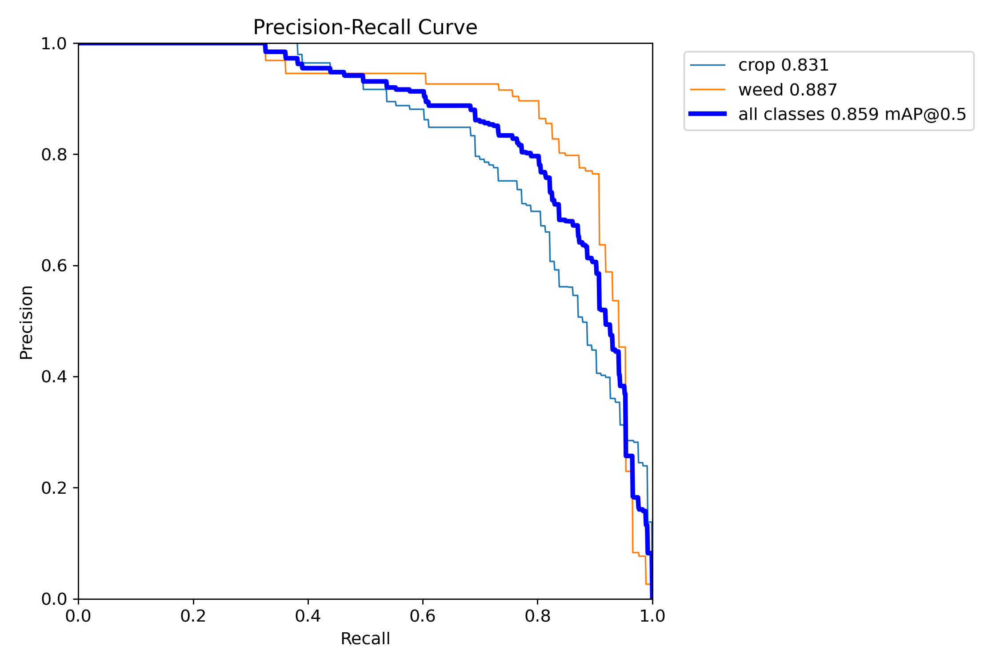

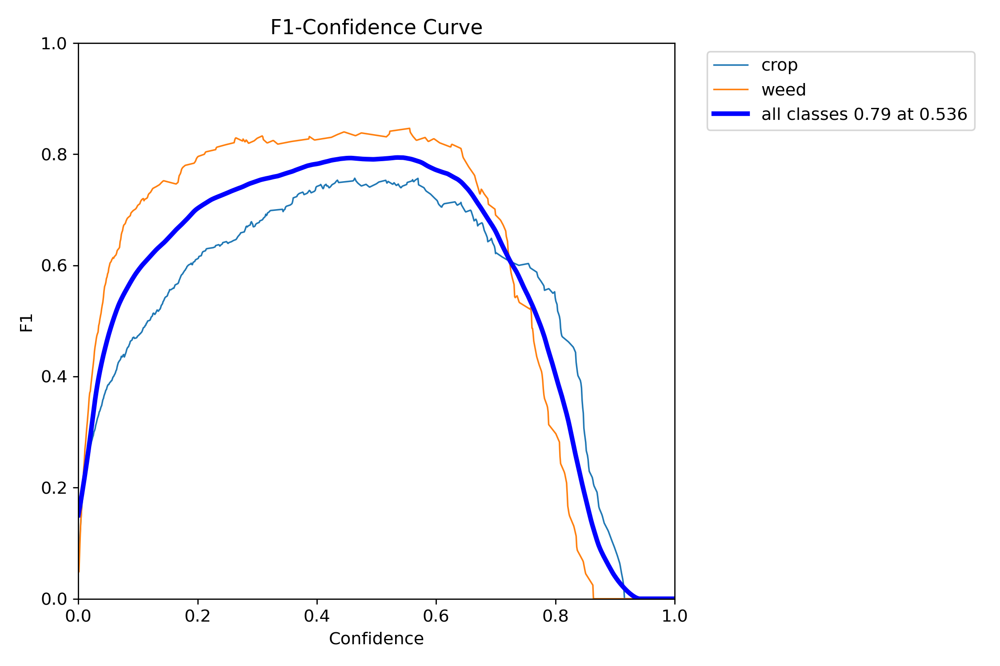

In [17]:
from IPython.display import display, Image

# Display an image from a file
display(Image(filename='/kaggle/working/runs/detect/train2/confusion_matrix_normalized.png'))
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch1_pred.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train2/val_batch2_labels.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train2/R_curve.png'))
display(Image(filename='/kaggle/working/runs/detect/train2/PR_curve.png'))
display(Image(filename='/kaggle/working/runs/detect/train2/F1_curve.png'))



---
# Applying Model on House-Hold Crop


0: 640x480 1 weed, 44.9ms
Speed: 2.3ms preprocess, 44.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)


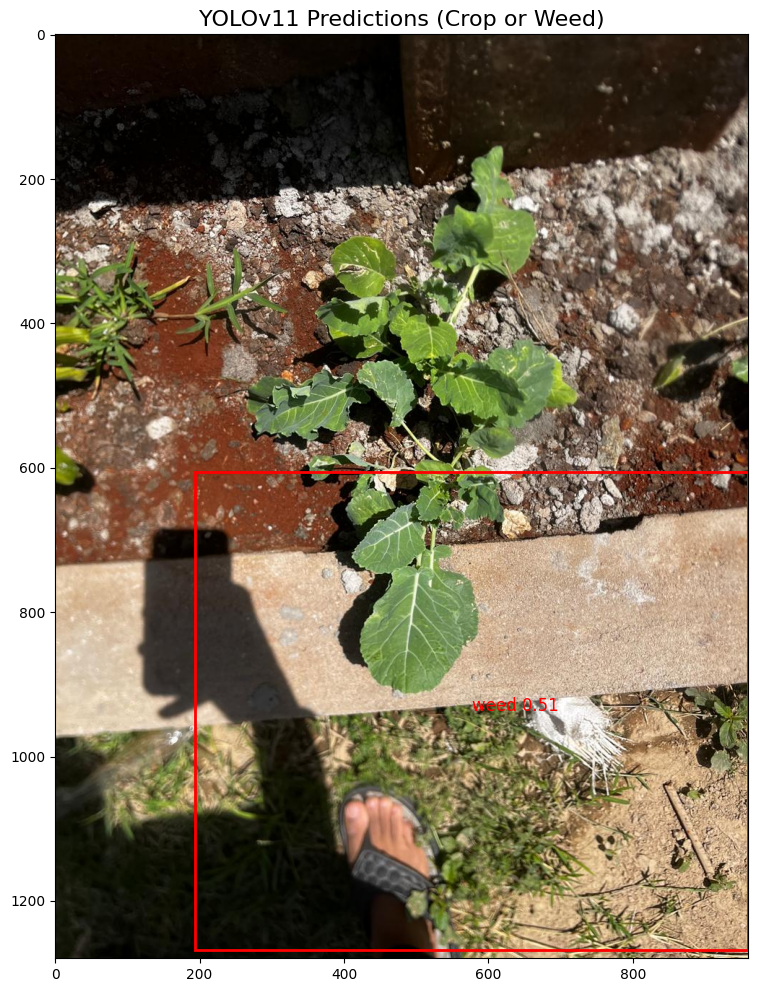

In [14]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the YOLO model
model_path = '/kaggle/working/runs/detect/train2/weights/best.pt'  # Update this path to your model file
model = YOLO(model_path)  # Load YOLO model

# Set confidence threshold
threshold = 0.5

# Function to predict if the image is a weed or crop
def predict_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    # Perform inference
    results = model(img, conf=threshold)  # Use the threshold for confidence

    # Access the first result
    result = results[0]

    # Extract the results (boxes, labels, and scores) and move tensors to CPU
    boxes = result.boxes.xywh.cpu().numpy()  # Convert to CPU and NumPy
    scores = result.boxes.conf.cpu().numpy()  # Convert to CPU and NumPy
    class_ids = result.boxes.cls.cpu().numpy().astype(int)  # Convert to CPU and NumPy
    labels = [result.names[i] for i in class_ids]  # Get class names

    # Visualize results
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(img)

    for box, score, label in zip(boxes, scores, labels):
        if score >= threshold:  # Apply threshold filter
            x, y, w, h = box
            rect = plt.Rectangle((x - w/2, y - h/2), w, h, linewidth=2, edgecolor="red", facecolor="none")
            ax.add_patch(rect)
            ax.text(x, y, f"{label} {score:.2f}", color='red', fontsize=12)

    plt.title("YOLOv11 Predictions (Crop or Weed)", fontsize=16)
    plt.show()

# Example usage on a personal image
image_path = '/kaggle/input/agri-data1/data/IMG-20250206-WA0011.jpg'  # Update this with your image path
predict_image(image_path)



0: 640x480 1 weed, 9.7ms
Speed: 3.0ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


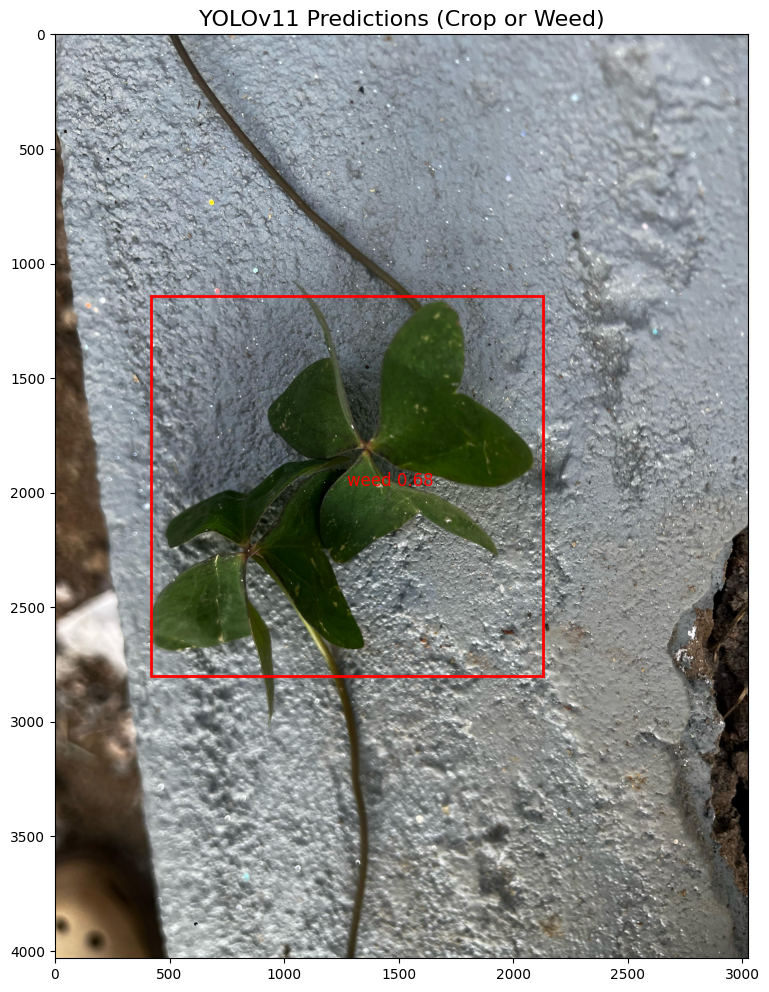

In [15]:
# Example usage on a personal image
image_path = '/kaggle/input/agri-data1/data/IMG-20250208-WA0004.jpg'  # Update this with your image path
predict_image(image_path)# sesame plant

# Recommendations

To improve the detection of weeds from crops in your YOLOv11 model, several strategies can be considered. 
- Firstly, ensuring high-quality and diverse training data is crucial. Including a wide variety of images on Testing Crops like Spinach and common weeds within JKUAT, covering different lighting conditions, angles, and weed/crop variations, will help the model generalize better and be more robust.
- Augmenting the dataset with techniques like rotation, flipping, and scaling can simulate various real-world scenarios, further boosting the model's ability to detect weeds under diverse conditions. We can also consider fine-tuning the model with a higher learning rate or adjusting the batch size to optimize training i.e. Increasing the number of Epoch as we monitor performance.
- Implementing techniques like data normalization and improving the balance between crop and weed images in the dataset can also prevent the model from being biased toward one class. Moreover, experimenting with different IoU (Intersection over Union) thresholds during training and inference can help in improving localization accuracy, particularly for overlapping instances of weeds and crops.
- Leveraging post-processing techniques like non-maximum suppression (NMS) with optimized thresholding may help remove duplicate predictions and improve the clarity of the final detection results.
- Combining these improvements will likely enhance both the precision and recall of your weed detection model.